# <font color=#025dfa>Customer Segmentation - Clustering

In [2]:
#pip install yellowbrick

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "plotly_white"
import warnings
warnings.filterwarnings('ignore') 

from datetime import datetime
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage

In [4]:
pd.set_option('display.max_columns', None) #verileri genişletmeye yarıyor
pd.set_option('display.max_rows', None)

In [5]:
df=pd.read_csv("PBL5recommendationdata.csv", encoding = "latin-1")

## <font color=#d707f2> EDA Exploratory Data Analsis

In [7]:
df.head()

,Customers.id,Customers.fname,Customers.lname,Customers.company,Customers.create_date,Customers.status,Customers.mailing,Customers.reminders,Customers.tax_exempt,Customers.account_id,Customers.sales_rep,Customers.rewards,Customers.profile_id,Customers.last_modified,Customers.customer_type,Orders.id,Orders.customer_id,Orders.fname,Orders.lname,Orders.company,Orders.order_number,Orders.reorder_id,Orders.external_source,Orders.external_id,Orders.currency,Orders.sales_rep,Orders.subtotal,Orders.tax,Orders.shipping,Orders.coupon_id,Orders.coupon_amount,Orders.gift_id,Orders.gift_amount,Orders.fee_name,Orders.fee_amount,Orders.discount_name,Orders.discount_amount,Orders.total,Orders.balance_due,Orders.shipping_carrier,Orders.shipping_method,Orders.shipping_trans,Orders.shipping_flags,Orders.weight,Orders.tracking,Orders.payment_status,Orders.payment_date,Orders.payment_user,Orders.payment_type,Orders.payment_method,Orders.payment_amount,Orders.purchase_order,Orders.payment_id,Orders.payment_code,Orders.payment_ref,Orders.status,Orders.placed_date,Orders.updated_date,Orders.shipped_date,Orders.comments,Orders.notes,Orders.registry_id,Orders.gift_message,Orders.website,Orders.mailing,Orders.flags,Orders.partial_ship,Orders.customer_type,Order_Items.id,Order_Items.parent,Order_Items.product_id,Order_Items.product_name,Order_Items.attributes,Order_Items.attribute_names,Order_Items.attribute_prices,Order_Items.qty,Order_Items.price,Order_Items.cost,Order_Items.registry_item,Order_Items.related_id,Order_Items.reorder_frequency,Order_Items.account_id,Order_Items.flags,Products.id,Products.status,Products.product_type,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.menu_name,Products.list_price,Products.price,Products.sale_price,Products.cost,Products.flags,Products.left_flag,Products.right_flag,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_gender,Products.shopping_color,Products.shopping_age,Products.shopping_flags,Products.amazon_asin,Products.amazon_type,Products.amazon_item_type,Products.amazon_price,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.google_adwords,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.price_break_type,Products.price_breaks,Products.short_description,Products.long_description,Products.websites,Products.video,Products.audio,Products.seo_title,Products.seo_description,Products.seo_keywords,Products.seo_header,Products.seo_footer,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.display_packaging,Products.multiple,Products.length,Products.width,Products.height,Products.rx,Products.latex,Products.upc,Products.msds_link,Products.msds_label,Products.lit_link,Products.lit_label,Products.hcpcs,Products.case_qty,Products.markup,Products.override_markup,Products.notes,Products.import_flags,Products.map_price,Products.features_title,Products.warranty,Products.hygienic,Products.default_quantity,Products.user_size,Products.assembly,Products.installation,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.shipping_weight,Products.handling_time,Products.rotation_link,Products.google_shopping_label,Products.product_option,Products.size,Products.material,Products.arm_style,Products.leg_style,Products.seat_size,Products.family_id,Products.saved_status,Products.freight_cost
0,797,Christy,Dill,Company0,1426018724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1437764306,0.0,3758,797,Christy,Dill,Company0,3758,NaN,NaN,NaN,USD,NaN,57.20,0.0,9.95,13.0,2.86,NaN,NaN,NaN,NaN,NaN,NaN,64.29,NaN,fedex,11|Ground,NaN,NaN,NaN,5.7204E+14,3.0,1.426019e+09,NaN,authorize.net,NaN,64.29,NaN,6993607863,510142,NaN,1,1426019099,1.438868e+09,1.426101e+09,NaN,Insured By Eye4Fraud,NaN,NaN,NaN,NaN,NaN,NaN,0.0,528

In [8]:
df.sample(5)

,Customers.id,Customers.fname,Customers.lname,Customers.company,Customers.create_date,Customers.status,Customers.mailing,Customers.reminders,Customers.tax_exempt,Customers.account_id,Customers.sales_rep,Customers.rewards,Customers.profile_id,Customers.last_modified,Customers.customer_type,Orders.id,Orders.customer_id,Orders.fname,Orders.lname,Orders.company,Orders.order_number,Orders.reorder_id,Orders.external_source,Orders.external_id,Orders.currency,Orders.sales_rep,Orders.subtotal,Orders.tax,Orders.shipping,Orders.coupon_id,Orders.coupon_amount,Orders.gift_id,Orders.gift_amount,Orders.fee_name,Orders.fee_amount,Orders.discount_name,Orders.discount_amount,Orders.total,Orders.balance_due,Orders.shipping_carrier,Orders.shipping_method,Orders.shipping_trans,Orders.shipping_flags,Orders.weight,Orders.tracking,Orders.payment_status,Orders.payment_date,Orders.payment_user,Orders.payment_type,Orders.payment_method,Orders.payment_amount,Orders.purchase_order,Orders.payment_id,Orders.payment_code,Orders.payment_ref,Orders.status,Orders.placed_date,Orders.updated_date,Orders.shipped_date,Orders.comments,Orders.notes,Orders.registry_id,Orders.gift_message,Orders.website,Orders.mailing,Orders.flags,Orders.partial_ship,Orders.customer_type,Order_Items.id,Order_Items.parent,Order_Items.product_id,Order_Items.product_name,Order_Items.attributes,Order_Items.attribute_names,Order_Items.attribute_prices,Order_Items.qty,Order_Items.price,Order_Items.cost,Order_Items.registry_item,Order_Items.related_id,Order_Items.reorder_frequency,Order_Items.account_id,Order_Items.flags,Products.id,Products.status,Products.product_type,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.menu_name,Products.list_price,Products.price,Products.sale_price,Products.cost,Products.flags,Products.left_flag,Products.right_flag,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_gender,Products.shopping_color,Products.shopping_age,Products.shopping_flags,Products.amazon_asin,Products.amazon_type,Products.amazon_item_type,Products.amazon_price,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.google_adwords,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.price_break_type,Products.price_breaks,Products.short_description,Products.long_description,Products.websites,Products.video,Products.audio,Products.seo_title,Products.seo_description,Products.seo_keywords,Products.seo_header,Products.seo_footer,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.display_packaging,Products.multiple,Products.length,Products.width,Products.height,Products.rx,Products.latex,Products.upc,Products.msds_link,Products.msds_label,Products.lit_link,Products.lit_label,Products.hcpcs,Products.case_qty,Products.markup,Products.override_markup,Products.notes,Products.import_flags,Products.map_price,Products.features_title,Products.warranty,Products.hygienic,Products.default_quantity,Products.user_size,Products.assembly,Products.installation,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.shipping_weight,Products.handling_time,Products.rotation_link,Products.google_shopping_label,Products.product_option,Products.size,Products.material,Products.arm_style,Products.leg_style,Products.seat_size,Products.family_id,Products.saved_status,Products.freight_cost
1424,1179,robert,darreff,NaN,1434765484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1437559489,0.0,4593,1179,robert,darreff,NaN,4593,NaN,NaN,NaN,USD,NaN,120.99,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120.99,NaN,fedex,11|Ground,NaN,NaN,NaN,1.28597E+14,3.0,1.434766e+09,NaN,authorize.net,NaN,120.99,NaN,7277538277,01990Z,NaN,1,1434765597,1.440535e+09,1.435008e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,6224,4593,852.0,"Me

In [9]:
df.tail(3)

,Customers.id,Customers.fname,Customers.lname,Customers.company,Customers.create_date,Customers.status,Customers.mailing,Customers.reminders,Customers.tax_exempt,Customers.account_id,Customers.sales_rep,Customers.rewards,Customers.profile_id,Customers.last_modified,Customers.customer_type,Orders.id,Orders.customer_id,Orders.fname,Orders.lname,Orders.company,Orders.order_number,Orders.reorder_id,Orders.external_source,Orders.external_id,Orders.currency,Orders.sales_rep,Orders.subtotal,Orders.tax,Orders.shipping,Orders.coupon_id,Orders.coupon_amount,Orders.gift_id,Orders.gift_amount,Orders.fee_name,Orders.fee_amount,Orders.discount_name,Orders.discount_amount,Orders.total,Orders.balance_due,Orders.shipping_carrier,Orders.shipping_method,Orders.shipping_trans,Orders.shipping_flags,Orders.weight,Orders.tracking,Orders.payment_status,Orders.payment_date,Orders.payment_user,Orders.payment_type,Orders.payment_method,Orders.payment_amount,Orders.purchase_order,Orders.payment_id,Orders.payment_code,Orders.payment_ref,Orders.status,Orders.placed_date,Orders.updated_date,Orders.shipped_date,Orders.comments,Orders.notes,Orders.registry_id,Orders.gift_message,Orders.website,Orders.mailing,Orders.flags,Orders.partial_ship,Orders.customer_type,Order_Items.id,Order_Items.parent,Order_Items.product_id,Order_Items.product_name,Order_Items.attributes,Order_Items.attribute_names,Order_Items.attribute_prices,Order_Items.qty,Order_Items.price,Order_Items.cost,Order_Items.registry_item,Order_Items.related_id,Order_Items.reorder_frequency,Order_Items.account_id,Order_Items.flags,Products.id,Products.status,Products.product_type,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.menu_name,Products.list_price,Products.price,Products.sale_price,Products.cost,Products.flags,Products.left_flag,Products.right_flag,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_gender,Products.shopping_color,Products.shopping_age,Products.shopping_flags,Products.amazon_asin,Products.amazon_type,Products.amazon_item_type,Products.amazon_price,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.google_adwords,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.price_break_type,Products.price_breaks,Products.short_description,Products.long_description,Products.websites,Products.video,Products.audio,Products.seo_title,Products.seo_description,Products.seo_keywords,Products.seo_header,Products.seo_footer,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.display_packaging,Products.multiple,Products.length,Products.width,Products.height,Products.rx,Products.latex,Products.upc,Products.msds_link,Products.msds_label,Products.lit_link,Products.lit_label,Products.hcpcs,Products.case_qty,Products.markup,Products.override_markup,Products.notes,Products.import_flags,Products.map_price,Products.features_title,Products.warranty,Products.hygienic,Products.default_quantity,Products.user_size,Products.assembly,Products.installation,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.shipping_weight,Products.handling_time,Products.rotation_link,Products.google_shopping_label,Products.product_option,Products.size,Products.material,Products.arm_style,Products.leg_style,Products.seat_size,Products.family_id,Products.saved_status,Products.freight_cost
4191,3733,Tinna,Randall,NaN,1463413245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1463413245,NaN,17426,3733,Tinna,Randall,NaN,17426,NaN,NaN,NaN,USD,NaN,1099.00,0.0,NaN,32.0,109.9,NaN,NaN,NaN,NaN,NaN,NaN,989.10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.463413e+09,Berry,authorize.net,NaN,989.10,NaN,8411549709,01466D,NaN,5,1463413246,1.463420e+09,NaN,NaN,Phone Order,NaN,NaN,NaN,NaN,NaN,NaN,0.0,20191,17426,2707.0,Spitfire EX 

In [10]:
df.shape

(4194, 181)

In [1]:
df.info()

NameError: name 'df' is not defined

In [ ]:
df.describe()

In [13]:
df.isnull().sum().sort_values(ascending=False)

Products.freight_cost             4194
Orders.mailing                    4194
Orders.gift_message               4194
Orders.registry_id                4194
Products.right_flag               4194
Orders.sales_rep                  4194
Products.markup                   4194
Orders.payment_ref                4194
Products.websites                 4194
Orders.purchase_order             4194
Orders.gift_id                    4194
Orders.gift_amount                4194
Products.price_breaks             4194
Products.seo_footer               4194
Products.default_quantity         4194
Orders.shipping_flags             4194
Products.price_break_type         4194
Orders.shipping_trans             4194
Orders.website                    4194
Products.amazon_type              4194
Order_Items.account_id            4194
Order_Items.attributes            4194
Order_Items.attribute_prices      4194
Products.menu_name                4194
Order_Items.registry_item         4194
Order_Items.related_id   

## <font color=#e82709> Feature Engineering

### <font color='#0975e8'> Boşluk Varsa Doldurmaya, Düzeltilecek Kısım Varsa Düzetmaye Başladık

sns.countplot(x=df[])
plt.xticks(rotation=90);

df[].value_counts().plot.pie(autopct='%1.1f%%',explode=[,,,]);

sns.distplot(x=df[])
plt.xticks(rotation=90);

sns.histplot(x=df[]);

sns.boxplot(x='',y='',data=df);
plt.xticks(rotation=90);

### <font color=violet> Düzenleme

In [19]:
df.head(1)

,Customers.id,Customers.fname,Customers.lname,Customers.company,Customers.create_date,Customers.status,Customers.mailing,Customers.reminders,Customers.tax_exempt,Customers.account_id,Customers.sales_rep,Customers.rewards,Customers.profile_id,Customers.last_modified,Customers.customer_type,Orders.id,Orders.customer_id,Orders.fname,Orders.lname,Orders.company,Orders.order_number,Orders.reorder_id,Orders.external_source,Orders.external_id,Orders.currency,Orders.sales_rep,Orders.subtotal,Orders.tax,Orders.shipping,Orders.coupon_id,Orders.coupon_amount,Orders.gift_id,Orders.gift_amount,Orders.fee_name,Orders.fee_amount,Orders.discount_name,Orders.discount_amount,Orders.total,Orders.balance_due,Orders.shipping_carrier,Orders.shipping_method,Orders.shipping_trans,Orders.shipping_flags,Orders.weight,Orders.tracking,Orders.payment_status,Orders.payment_date,Orders.payment_user,Orders.payment_type,Orders.payment_method,Orders.payment_amount,Orders.purchase_order,Orders.payment_id,Orders.payment_code,Orders.payment_ref,Orders.status,Orders.placed_date,Orders.updated_date,Orders.shipped_date,Orders.comments,Orders.notes,Orders.registry_id,Orders.gift_message,Orders.website,Orders.mailing,Orders.flags,Orders.partial_ship,Orders.customer_type,Order_Items.id,Order_Items.parent,Order_Items.product_id,Order_Items.product_name,Order_Items.attributes,Order_Items.attribute_names,Order_Items.attribute_prices,Order_Items.qty,Order_Items.price,Order_Items.cost,Order_Items.registry_item,Order_Items.related_id,Order_Items.reorder_frequency,Order_Items.account_id,Order_Items.flags,Products.id,Products.status,Products.product_type,Products.template,Products.vendor,Products.import_id,Products.name,Products.display_name,Products.menu_name,Products.list_price,Products.price,Products.sale_price,Products.cost,Products.flags,Products.left_flag,Products.right_flag,Products.last_modified,Products.taxable,Products.shopping_gtin,Products.shopping_brand,Products.shopping_mpn,Products.shopping_gender,Products.shopping_color,Products.shopping_age,Products.shopping_flags,Products.amazon_asin,Products.amazon_type,Products.amazon_item_type,Products.amazon_price,Products.google_shopping_id,Products.google_shopping_type,Products.google_shopping_cat,Products.google_adwords,Products.shopping_cat,Products.shopping_type,Products.pricegrabber_cat,Products.shopzilla_cat,Products.thefind_cat,Products.quickbooks_id,Products.qb_edit_sequence,Products.price_break_type,Products.price_breaks,Products.short_description,Products.long_description,Products.websites,Products.video,Products.audio,Products.seo_title,Products.seo_description,Products.seo_keywords,Products.seo_header,Products.seo_footer,Products.seo_url,Products.seo_category,Products.unit,Products.packaging,Products.display_packaging,Products.multiple,Products.length,Products.width,Products.height,Products.rx,Products.latex,Products.upc,Products.msds_link,Products.msds_label,Products.lit_link,Products.lit_label,Products.hcpcs,Products.case_qty,Products.markup,Products.override_markup,Products.notes,Products.import_flags,Products.map_price,Products.features_title,Products.warranty,Products.hygienic,Products.default_quantity,Products.user_size,Products.assembly,Products.installation,Products.shipping_length,Products.shipping_width,Products.shipping_height,Products.shipping_weight,Products.handling_time,Products.rotation_link,Products.google_shopping_label,Products.product_option,Products.size,Products.material,Products.arm_style,Products.leg_style,Products.seat_size,Products.family_id,Products.saved_status,Products.freight_cost
0,797,Christy,Dill,Company0,1426018724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1437764306,0.0,3758,797,Christy,Dill,Company0,3758,NaN,NaN,NaN,USD,NaN,57.2,0.0,9.95,13.0,2.86,NaN,NaN,NaN,NaN,NaN,NaN,64.29,NaN,fedex,11|Ground,NaN,NaN,NaN,5.7204E+14,3.0,1.426019e+09,NaN,authorize.net,NaN,64.29,NaN,6993607863,510142,NaN,1,1426019099,1.438868e+09,1.426101e+09,NaN,Insured By Eye4Fraud,NaN,NaN,NaN,NaN,NaN,NaN,0.0,5284

In [20]:
customer=df[['Customers.create_date','Customers.last_modified','Customers.customer_type','Customers.id']]

In [21]:
product=df[['Products.list_price','Products.price','Products.cost','Products.status']]

In [22]:
order=df[['Orders.subtotal','Orders.total','Orders.payment_status','Orders.payment_amount','Orders.status','Orders.payment_date']]

#### <font color=#2da6f7> customer'a bakıyoruz

In [24]:
customer.isnull().sum

<bound method DataFrame.sum of       Customers.create_date  Customers.last_modified  Customers.customer_type  \
0                     False                    False                    False   
1                     False                    False                    False   
2                     False                    False                    False   
3                     False                    False                    False   
4                     False                    False                    False   
5                     False                    False                    False   
6                     False                    False                    False   
7                     False                    False                    False   
8                     False                    False                    False   
9                     False                    False                    False   
10                    False                    False                    False 

In [25]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Customers.create_date    4194 non-null   int64  
 1   Customers.last_modified  4194 non-null   int64  
 2   Customers.customer_type  3771 non-null   float64
 3   Customers.id             4194 non-null   int64  
dtypes: float64(1), int64(3)
memory usage: 131.2 KB


In [26]:
df['Customers.customer_type'].mean(),df['Customers.customer_type'].mode(),df['Customers.customer_type'].median()

(0.1373640944046672,
 0    0.0
 Name: Customers.customer_type, dtype: float64,
 0.0)

In [27]:
customer['Customers.customer_type']=customer['Customers.customer_type'].fillna(customer['Customers.customer_type'].mean())

In [28]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Customers.create_date    4194 non-null   int64  
 1   Customers.last_modified  4194 non-null   int64  
 2   Customers.customer_type  4194 non-null   float64
 3   Customers.id             4194 non-null   int64  
dtypes: float64(1), int64(3)
memory usage: 131.2 KB


In [29]:
customer.head()

,Customers.create_date,Customers.last_modified,Customers.customer_type,Customers.id
0,1426018724,1437764306,0.0,797
1,1386089139,1437764354,0.0,3
2,1386089139,1437764354,0.0,3
3,1386780263,1437762646,0.0,4
4,1386861599,1437764316,0.0,5


#### <font color=#2da6f7> product'a bakıyoruz

In [31]:
product.isnull().sum

<bound method DataFrame.sum of       Products.list_price  Products.price  Products.cost  Products.status
0                   False           False          False            False
1                   False           False          False            False
2                   False           False          False            False
3                   False           False          False            False
4                   False           False          False            False
5                    True            True           True             True
6                    True            True           True             True
7                   False           False          False            False
8                   False           False          False            False
9                    True            True           True             True
10                   True            True           True             True
11                  False           False          False            False
12     

In [32]:
product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Products.list_price  4017 non-null   float64
 1   Products.price       4036 non-null   float64
 2   Products.cost        4037 non-null   float64
 3   Products.status      4037 non-null   float64
dtypes: float64(4)
memory usage: 131.2 KB


In [33]:
df['Products.list_price'].mean(),df['Products.list_price'].mode(),df['Products.list_price'].median()

(121.68332088623352,
 0    279.99
 Name: Products.list_price, dtype: float64,
 72.33)

In [34]:
df['Products.price'].mean(),df['Products.price'].mode(),df['Products.price'].median()

(74.26604311199208,
 0    199.99
 Name: Products.price, dtype: float64,
 48.245)

In [35]:
df['Products.cost'].mean(),df['Products.cost'].mode(),df['Products.cost'].median()

(52.318191726529605,
 0    97.0
 Name: Products.cost, dtype: float64,
 31.75)

In [36]:
df['Products.status'].mean(),df['Products.status'].mode(),df['Products.status'].median()

(0.9871191478820907,
 0    0.0
 Name: Products.status, dtype: float64,
 0.0)

In [37]:
product['Products.list_price']=product['Products.list_price'].fillna(product['Products.list_price'].mean())

In [38]:
product['Products.price']=product['Products.price'].fillna(product['Products.price'].mean())

In [39]:
product['Products.cost']=product['Products.cost'].fillna(product['Products.cost'].mean())

In [40]:
product['Products.status']=product['Products.status'].fillna(product['Products.status'].mean())

In [41]:
product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Products.list_price  4194 non-null   float64
 1   Products.price       4194 non-null   float64
 2   Products.cost        4194 non-null   float64
 3   Products.status      4194 non-null   float64
dtypes: float64(4)
memory usage: 131.2 KB


In [42]:
product.head()

,Products.list_price,Products.price,Products.cost,Products.status
0,80.70,57.64,44.00,0.0
1,14.41,10.29,1.87,1.0
2,96.29,68.78,52.50,0.0
3,27.38,19.56,12.62,0.0
4,50.47,36.05,25.75,1.0


#### <font color=#2da6f7> order'a bakıyoruz

In [44]:
order.isnull().sum

<bound method DataFrame.sum of       Orders.subtotal  Orders.total  Orders.payment_status  \
0               False         False                  False   
1               False         False                  False   
2               False         False                  False   
3               False         False                  False   
4               False         False                  False   
5               False         False                  False   
6               False         False                  False   
7               False         False                  False   
8               False         False                  False   
9               False         False                  False   
10              False         False                  False   
11              False         False                  False   
12              False         False                  False   
13              False         False                  False   
14              False         False    

In [45]:
order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Orders.subtotal        4194 non-null   float64
 1   Orders.total           4194 non-null   float64
 2   Orders.payment_status  4189 non-null   float64
 3   Orders.payment_amount  4176 non-null   float64
 4   Orders.status          4194 non-null   int64  
 5   Orders.payment_date    4176 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 196.7 KB


In [46]:
df['Orders.payment_status'].mean(),df['Orders.payment_status'].mode(),df['Orders.payment_status'].median()

(2.9589400811649558,
 0    3.0
 Name: Orders.payment_status, dtype: float64,
 3.0)

In [47]:
df['Orders.payment_amount'].mean(),df['Orders.payment_amount'].mode(),df['Orders.payment_amount'].median()

(134.8422629310345,
 0    129.99
 Name: Orders.payment_amount, dtype: float64,
 79.99)

In [48]:
df['Orders.payment_date'].mean(),df['Orders.payment_date'].mode(),df['Orders.payment_date'].median()

(1443103868.3663793,
 0    1.461860e+09
 Name: Orders.payment_date, dtype: float64,
 1449677976.5)

In [49]:
order['Orders.payment_status']=order['Orders.payment_status'].fillna(order['Orders.payment_status'].mean())

In [50]:
order['Orders.payment_amount']=order['Orders.payment_amount'].fillna(order['Orders.payment_amount'].mean())

In [51]:
order['Orders.payment_date']=order['Orders.payment_date'].fillna(order['Orders.payment_date'].mean())

In [52]:
order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Orders.subtotal        4194 non-null   float64
 1   Orders.total           4194 non-null   float64
 2   Orders.payment_status  4194 non-null   float64
 3   Orders.payment_amount  4194 non-null   float64
 4   Orders.status          4194 non-null   int64  
 5   Orders.payment_date    4194 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 196.7 KB


In [53]:
order.head()

,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.status,Orders.payment_date
0,57.20,64.29,3.0,64.29,1,1.426019e+09
1,20.00,29.99,3.0,29.99,1,1.386090e+09
2,68.78,78.73,3.0,78.73,3,1.449604e+09
3,19.56,29.55,3.0,29.55,1,1.386780e+09
4,36.05,46.00,3.0,46.00,1,1.386862e+09


## <font color=#fa7efc> Modelling

In [64]:
x=pd.concat([customer,product,order],axis=1)

In [66]:
x.head()

,Customers.create_date,Customers.last_modified,Customers.customer_type,Customers.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.status,Orders.payment_date
0,1426018724,1437764306,0.0,797,80.70,57.64,44.00,0.0,57.20,64.29,3.0,64.29,1,1.426019e+09
1,1386089139,1437764354,0.0,3,14.41,10.29,1.87,1.0,20.00,29.99,3.0,29.99,1,1.386090e+09
2,1386089139,1437764354,0.0,3,96.29,68.78,52.50,0.0,68.78,78.73,3.0,78.73,3,1.449604e+09
3,1386780263,1437762646,0.0,4,27.38,19.56,12.62,0.0,19.56,29.55,3.0,29.55,1,1.386780e+09
4,1386861599,1437764316,0.0,5,50.47,36.05,25.75,1.0,36.05,46.00,3.0,46.00,1,1.386862e+09


In [68]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4194 entries, 0 to 4193
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Customers.create_date    4194 non-null   int64  
 1   Customers.last_modified  4194 non-null   int64  
 2   Customers.customer_type  4194 non-null   float64
 3   Customers.id             4194 non-null   int64  
 4   Products.list_price      4194 non-null   float64
 5   Products.price           4194 non-null   float64
 6   Products.cost            4194 non-null   float64
 7   Products.status          4194 non-null   float64
 8   Orders.subtotal          4194 non-null   float64
 9   Orders.total             4194 non-null   float64
 10  Orders.payment_status    4194 non-null   float64
 11  Orders.payment_amount    4194 non-null   float64
 12  Orders.status            4194 non-null   int64  
 13  Orders.payment_date      4194 non-null   float64
dtypes: float64(10), int64(4)

In [70]:
KM=KMeans(5)
#KMeans(x) 0'dan başlayıp x'e(x dahil değil) kadar sayıları alıyor

In [72]:
KM=KM.fit(x)

In [73]:
tahmin=KM.predict(x)

In [76]:
tahmin

array([3, 1, 3, ..., 2, 2, 2])

In [78]:
x['Cluster']=tahmin

In [80]:
x.head()

,Customers.create_date,Customers.last_modified,Customers.customer_type,Customers.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.status,Orders.payment_date,Cluster
0,1426018724,1437764306,0.0,797,80.70,57.64,44.00,0.0,57.20,64.29,3.0,64.29,1,1.426019e+09,3
1,1386089139,1437764354,0.0,3,14.41,10.29,1.87,1.0,20.00,29.99,3.0,29.99,1,1.386090e+09,1
2,1386089139,1437764354,0.0,3,96.29,68.78,52.50,0.0,68.78,78.73,3.0,78.73,3,1.449604e+09,3
3,1386780263,1437762646,0.0,4,27.38,19.56,12.62,0.0,19.56,29.55,3.0,29.55,1,1.386780e+09,1
4,1386861599,1437764316,0.0,5,50.47,36.05,25.75,1.0,36.05,46.00,3.0,46.00,1,1.386862e+09,1


In [82]:
silhouette_score(x,tahmin)

0.5308856218151715

In [96]:
#wscc = within cluster sun of squares = küme içi toplam kare kaybı
wcss=[]
ss=[]
for i in range(2,10):
    model=KMeans(i)
    model=model.fit(x)
    tahmin=model.predict(x)
    ss1=silhouette_score(x,tahmin)
    ss.append(ss1)
    print(ss1)
    wcss.append(model.inertia_)

0.6626407411413507
0.623025306403511
0.5342276915055251
0.5310742067388922
0.543212040704707
0.5446844176768142
0.5373149706957393
0.5448519475180099


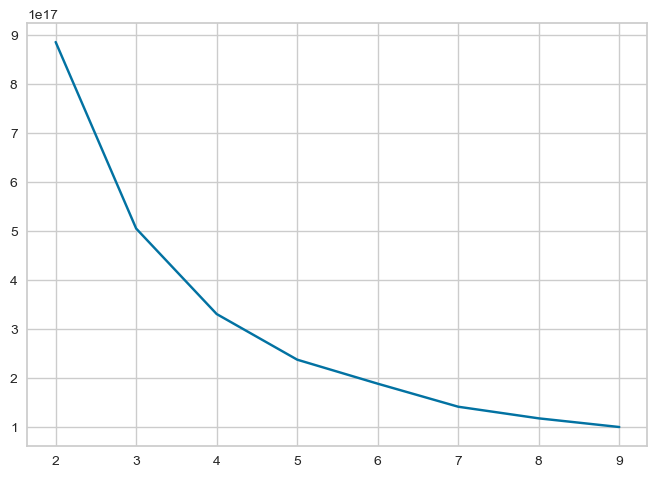

In [98]:
plt.plot(range(2,10),wcss);

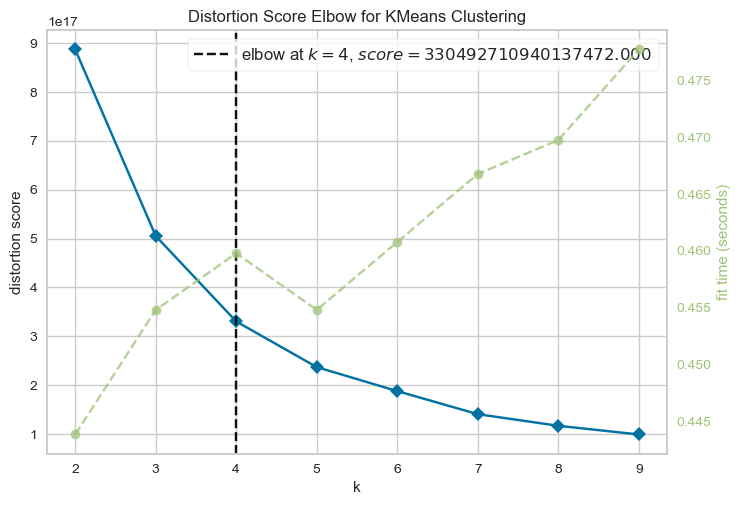

In [86]:
vis=KElbowVisualizer(KM,k=(2,10))
vis.fit(x)
vis.show();

### <font color=#b798fa> Hierachical Clustering

In [100]:
data=linkage(x,method='ward', metric='euclidean')

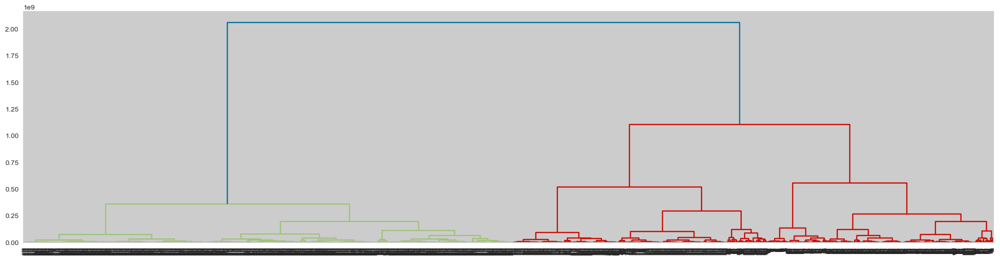

In [106]:
plt.figure(figsize=(25,6))
dendrogram(data);

In [113]:
x['customerID']=df['Customers.id']
x

,Customers.create_date,Customers.last_modified,Customers.customer_type,Customers.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.status,Orders.payment_date,Cluster,customerID
0,1426018724,1437764306,0.000000,797,80.700000,57.640000,44.000000,0.000000,57.20,64.29,3.00000,64.290000,1,1.426019e+09,3,797
1,1386089139,1437764354,0.000000,3,14.410000,10.290000,1.870000,1.000000,20.00,29.99,3.00000,29.990000,1,1.386090e+09,1,3
2,1386089139,1437764354,0.000000,3,96.290000,68.780000,52.500000,0.000000,68.78,78.73,3.00000,78.730000,3,1.449604e+09,3,3
3,1386780263,1437762646,0.000000,4,27.380000,19.560000,12.620000,0.000000,19.56,29.55,3.00000,29.550000,1,1.386780e+09,1,4
4,1386861599,1437764316,0.000000,5,50.470000,36.050000,25.750000,1.000000,36.05,46.00,3.00000,46.000000,1,1.386862e+09,1,5
5,1386861599,1437764316,0.000000,5,121.683321,74.266043,52.318192,0.987119,44.46,54.41,0.00000,134.842263,1,1.443104e+09,3,5
6,1386861599,1437764316,0.000000,5,121.683321,74.266043,52.318192,0.987119,14.63,24.58,3.00000,24.580000,1,1.410364e+09,1,5
7,1388155947,1437763617,0.000000,7,54.870000,39.190000,27.990000,0.000000,39.19,49.14,3.00000,49.140000,1,1.388156e+09,1,7
8,1389303216,1437763421,0.000000,8,84.290000,60.210000,45.960000,0.000000,59.75,69.70,3.00000,69.700000,1,1.389647e+09,1,8
9,1390509516,1437763553,0.000000,10,121.683321,74.266043,52.318192,0.987119,34.00,34.00,3.00000,34.000000,1,1.390510e+09,1,10


In [115]:
x['Orders.payment_date']=pd.to_datetime(x['Orders.payment_date'],unit='s')
x

,Customers.create_date,Customers.last_modified,Customers.customer_type,Customers.id,Products.list_price,Products.price,Products.cost,Products.status,Orders.subtotal,Orders.total,Orders.payment_status,Orders.payment_amount,Orders.status,Orders.payment_date,Cluster,customerID
0,1426018724,1437764306,0.000000,797,80.700000,57.640000,44.000000,0.000000,57.20,64.29,3.00000,64.290000,1,2015-03-10 20:24:59.000000000,3,797
1,1386089139,1437764354,0.000000,3,14.410000,10.290000,1.870000,1.000000,20.00,29.99,3.00000,29.990000,1,2013-12-03 17:07:35.000000000,1,3
2,1386089139,1437764354,0.000000,3,96.290000,68.780000,52.500000,0.000000,68.78,78.73,3.00000,78.730000,3,2015-12-08 19:40:52.000000000,3,3
3,1386780263,1437762646,0.000000,4,27.380000,19.560000,12.620000,0.000000,19.56,29.55,3.00000,29.550000,1,2013-12-11 16:44:23.000000000,1,4
4,1386861599,1437764316,0.000000,5,50.470000,36.050000,25.750000,1.000000,36.05,46.00,3.00000,46.000000,1,2013-12-12 15:19:59.000000000,1,5
5,1386861599,1437764316,0.000000,5,121.683321,74.266043,52.318192,0.987119,44.46,54.41,0.00000,134.842263,1,2015-09-24 14:11:08.366379264,3,5
6,1386861599,1437764316,0.000000,5,121.683321,74.266043,52.318192,0.987119,14.63,24.58,3.00000,24.580000,1,2014-09-10 15:40:55.000000000,1,5
7,1388155947,1437763617,0.000000,7,54.870000,39.190000,27.990000,0.000000,39.19,49.14,3.00000,49.140000,1,2013-12-27 14:52:27.000000000,1,7
8,1389303216,1437763421,0.000000,8,84.290000,60.210000,45.960000,0.000000,59.75,69.70,3.00000,69.700000,1,2014-01-13 21:10:43.000000000,1,8
9,1390509516,1437763553,0.000000,10,121.683321,74.266043,52.318192,0.987119,34.00,34.00,3.00000,34.000000,1,2014-01-23 20:42:54.000000000,1,10


In [129]:
now = pd.to_datetime('2023-08-28')
recency = now - x.groupby('customerID')['Orders.payment_date'].max()
recency = recency.dt.days
frequency = x.groupby('customerID')['Orders.payment_date'].count()
monetary = x.groupby('customerID')['Orders.total'].sum()

In [131]:
rfm_df = pd.DataFrame({
'Recency': recency,
'Frequency': frequency,
'Monetary': monetary
})
rfm_df

,Recency,Frequency,Monetary
customerID,,,
3,2819,2,108.72
4,3546,1,29.55
5,2894,3,124.99
7,3530,1,49.14
8,3513,1,69.70
10,3503,1,34.00
11,3448,1,34.00
12,3501,1,31.47
13,3113,3,322.93
